# Image colorization
## Author: Mihail Kalachev

### Abstract

In this paper I examine the possibilities of using a Fully Convolutional Neural Network (FCN) model for bringing color into black and white pictures. My research is based on a couple of papers, more closely on [Richard Zhang, Phillip Isola, Alexei A. Efros, 2016, Colorful Image Colorization](https://arxiv.org/abs/1603.08511). I start with a simple model and slowly build up to the bigger models in an attempt to find what the main challenges and difficulties of this task are, where the pitfalls lie and how much processing power is needed to get a good looking colorful picture.

### Technical overview

#### Problem overview

Coloring a Black and White picture is very popular these days. Everybody wants to imagine how an old photo would look like in color. However, colorization is a daunting task. It is usually done by hand in Photoshop. A picture can take up to one month to colorize. It requires extensive research. A face alone needs up to 20 layers of pink, green and blue shades to get it just right. So if there is a possibility to train any kind of algorithm to do this job automatically this will be a massive improvement.

Looking at a grayscale picture it seems close to impossible to make an algorithm bring color into it, because so much of the information has been lost. Looking more closely, however, one notices that in many cases, the semantics of the scene and its surface texture provide ample cues for many regions in each image: the grass is typically green, the sky is typically blue, and the ladybug is most definitely red. Of course, these kinds of semantic priors do not work for everything, e.g., a dress is not always red or blue, it can be any color. However, for this paper, our goal is not necessarily to recover the actual ground truth color, but rather to produce a plausible colorization that could potentially fool a human observer.

#### RGB space overview

Black and white images can be represented in grids of pixels. Each pixel has a value that corresponds to its brightness. The values span from 0–255, from black to white.

<img src="b_w_scale.png"/>

Color images usually consist of three layers: a red layer, a green layer, and a blue layer (some images have a fourth layer which determines opacity, but let's not consider it for simplicity). Each pixel of each layer spans from 0-255. It determines the color saturation of this layer as well as its brightness. The closer each pixel is to 0, the less bright this color is, 0 meaning no color in this layer.

<img src="rgb_pixels.png"/>

So unlike black and white pictures, color pictures have not only 1 dimention, but 3 (or 4).

Going back to our task. As we all know, a neural network creates a relationship between an input value and an output value. To be more precise with our colorization task, the network needs to find the traits that link grayscale images with colored ones so that it can learn to predict color.

In sum, we are searching for the features that link a grid of grayscale values to the three color grids (RGB)

<img src="rgb_function.png"/>

#### "Lab" space overview

Predicting the three layers of an RGB image, given it's black and white version as input, is possible, but challenging. Mostly so because the original input image is not present in the predicted output. This can lead to results where the output image does not quite look like the input image. It would be nice to have a way of including the black and white image in the output and only make the network bring color into it.

Introducing the CIE L*a*b colorspace. The CIELAB color space (also known as CIE L\*a\*b\* or sometimes abbreviated as simply "Lab" color space) is a color space defined by the International Commission on Illumination (CIE) in 1976. It expresses color as three numerical values, L\* for the lightness and a\* and b\* for the green–red and blue–yellow color components. CIELAB was designed to be perceptually uniform with respect to human color vision, meaning that the same amount of numerical change in these values corresponds to about the same amount of visually perceived change. 

As you can see below, a Lab encoded image has one layer for grayscale, and has packed three color layers into two. This means that we can use the original grayscale image in our final prediction. Also, we only have two channels to predict.

<img src="lab_decomposition.png"/>

Our final prediction looks like this. We have a grayscale layer for input, and we want to predict two color layers, the a\*b\* in Lab. To create the final color image we’ll include the L/grayscale image we used for the input. The result will be creating a L\*a\*b\* image.

<img src="lab_function.png"/>

#### Neural network architecture

One of the most common uses for a Convolutional Network these days is image classification. I will not go into detail how it works, but as we all know, a bunch of convolution filters are applied over the image to turn the image into a set of "features" in the form of numbers. Those "features" are then passed through a number of Dense layers until we generate a vector of numbers which predicts a probability vector that the picture falls into each one of predefined classes of objects.

However this will not work in our case. We need to take in the picture, get an understanding of what it represents, and then generate another picture based on this "understanding". This is what we call an "encoder / decoder" architecture. Here is how it looks:

<img src="net_diagram.jpg"/>

The first part of the network is called an "encoder" and is responsible for "understanding" what is in the picture. By applying convolution filters (which are trained during the model training process), it transforms the raw picture of only one dimension (256 x 256 x 1 in this example) into a much smaller picture with numerous  dimensions (32 x 32 x 512 in the figure above). After the the encoder is finished, it passes this numeric data to the "decoder". The decoder applies one of several possible techniques to "upsample" the raw data from the encoder by applying another set of convolution filters which in the end produce another picture (256 x 256 x 2 in our case). The resulting picture contains information about the color in the original black and white picture. In the end we get our result by combining the input picture with the Neural Network output to produce a colorful version of the picture.

This is also called a Fully Convolutional Network (FCN), because the architecture does not contain fully connected Dense layers, but instead has only Convolution layers. 

This is all you need to know for now. I will go into more detail about the specific architecture chosen, together with the code to explain it.

### Where you could find the data used in this paper

Throughout this paper, I have used mainly the Flickr 8k dataset which can be found under this link:

[Flickr 8k dataset](https://forms.illinois.edu/sec/1713398)

I have split the dataset myself into Train, Validation and Test data. The Train set contains 7691 images, while the Test and Validatoin sets contain 200 images each. The reason for such a split is I want to have as much pictures to train my network on, while I don't need more than  200 pictures to check my progress. Here is the zip archive containing my split and the Folders as well if you can't unzip it:

[Fickr 8k Zip archive](https://drive.google.com/open?id=1_ozOGdUTZkaSa3T9OXg7s_CDSGlOrcTM)

[Train folder](https://drive.google.com/open?id=1OBn-qVyILAm4znNxAPAW4itv6rZX854r)

[Validation folder](https://drive.google.com/open?id=1jx-LgLQX69gGAOlCqJkfs-1obm2X7f-h)

[Test folder](https://drive.google.com/open?id=1CBByDwGzqo3piDcOc5ghbiEhdtPhqCP5)

All trained models in this paper are saved to a saved_models folder which is shared here:

[Saved models folder](https://drive.google.com/open?id=12rT6G542nYD9QVtg5JOAEMNEDyFLaSKK)

The saved models could be used by first creating an empty model with the same structure that I used to save it (could be found in the paper) and then loading it like this:

`model.load_weights("/content/gdrive/My Drive/Colab Notebooks/saved_models/color_big_nn_datagen.h5")`

### Neural Network implementation

Let's begin.

The next two cells are related to mounting my Google Drive on my Google Colab VM.


In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

In [0]:
#!cp "/content/gdrive/My Drive/Colab Notebooks/Flick_dumps/"* .
#!cp "/content/gdrive/My Drive/Colab Notebooks/Flicker8k_Dataset.zip" .
#!unzip "/content/gdrive/My Drive/Colab Notebooks/Flicker8k_Dataset.zip"
!ls -la
#!cp "/content/gdrive/My Drive/Colab Notebooks/net_diagram.jpg"* .

In [0]:
import matplotlib.pyplot as plt

import numpy as np
import os

from tensorflow.keras.layers import Conv2D, UpSampling2D, InputLayer
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.optimizers import Adam

from skimage.color import rgb2lab, lab2rgb
from skimage.io import imsave, imshow, imread, imshow_collection
from skimage.transform import resize

#### Normalizing input data

Let's create a function, which takes in an RGB image, processes it and returns a one-dimensional black and white input image for my network and the expected output colors in "Lab" format (two-dimensional matrix). I want to normalize the input and rescale all values to fall within the [0, 1] range. It would be good to know what range of values the Lab format can produce. Wikipedia [3] tells us that `L` is between [0, 100] while `a` and `b` are *usually* between [-128, 127]. However a useful experiment [4] tells us that the actual values are as follows:

        L in [0, 100]
        A in [-86.185, 98.254]
        B in [-107.863, 94.482]

So we normalize the input and expected output based on those values.

In [0]:
def get_image_noresize(image_path):
    image = img_to_array(load_img(image_path), dtype = np.uint8)
 
    X = rgb2lab(image)[:,:,0] / 100.0
    Y = rgb2lab(image)[:,:,1:]
    Y[:,:,0] = (Y[:,:,0] + 86.185) / 184.439
    Y[:,:,1] = (Y[:,:,1] + 107.863) / 202.345
    return X, Y

#### Predicting output image

Now let's create a function which given an image and a trained NN model, converts the image to black and white, feeds it to our trained neural network and outputs the predicted color version next to the original image. As a first try, I have prepared several images of size 400 x 400 so this function makes that assumption for the input. The function also takes into account the normalization we did in the previous step so it "denormalizes" the data when the network makes its prediction. Finally the input black and white picture is put together with the 2 color dimensions predicted to produce a nice L\*a\*b\* picture which is then converted to RGB format to be displayed.

In [0]:
# for single image or comparison with original
def color_image_single(image_path, model):
    image = img_to_array(load_img(image_path), dtype = np.uint8)
    
    X = rgb2lab(image)[:,:,0] / 100.0
    X = X.reshape(1, 400, 400, 1)
    output = model.predict(X)
    output[0,:,:,0] = output[0,:,:,0] * 184.439 - 86.185
    output[0,:,:,1] = output[0,:,:,1] * 202.345 - 107.863
    
    # Output colorizations
    canvas = np.zeros((output.shape[1], output.shape[2], 3))
    canvas[:,:,0] = X[0][:,:,0] * 100.0
    canvas[:,:,1:] = output[0]

    imshow_collection((image, lab2rgb(canvas)))

#### A few words on the chosen model

Now let's make a small NN model which, as seen below, has only 31 618 trainable parameters. The model is somewhat based on [2] paper. We don't fix the input shape for now. There are a series of convolution layers, each of which shrinks the size of the original image, but increases the number of dimensions during the "encoding phase". We use a stride of 2 to reduce the image's first 2 dimensions with "same" padding. After each layer there is a ReLU activation function. 

During decoding we aim to increase the first 2 dimensions of the image to bring it back to the original size. There a couple of ways to do that. A nice paper on this [7] advises us that instead of using the so called "Transposed Convolution", which may cause checkerboard artifacts where the filters overlap, we should do a Near Neighbor Upsampling, followed by a normal convolution with stride = 1.

In the end I decided to use a sigmoid activation function which gives us values between 0 and 1 which is how I rescaled my output data.

Now a good question is what will be our loss function that we will try to mimimize. Since the model produces a 3 dimensional matrix as an output, the best loss function would be Mean Squared Error (MSE) which will be calculated over every pixel of the given vs predicted output.

And finally we use Adam optimizer with a default learning rate of 0.001

In [0]:
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

In [0]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 8)     80        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 16)    1168      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 16)    2320      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 32)    4640      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, None, None, 32)    9248      
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, None, None, 32)    0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, None, None, 32)    9248      
__________

In [0]:
opt = Adam(lr = 0.001)

model.compile(optimizer = opt, loss='mse')

#### Train the model on 1 image only

Now we train the model on only 1 image to check if it works correctly an makes believable predictions. We do expect the model to overfit this image, given enough epochs to train. 

After training is complete, we predict the colors of this same image.

In [0]:
X, Y = get_image_noresize("/content/gdrive/My Drive/Colab Notebooks/woman.jpg")
X = X.reshape(1, 400, 400, 1)
Y = Y.reshape(1, 400, 400, 2)

model.fit(x = X, y = Y, batch_size=1, epochs=1000)

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 0.0058
Epoch 2/1000
1/1 [==============================] - 0s 25ms/step - loss: 0.0049
Epoch 3/1000
1/1 [==============================] - 0s 23ms/step - loss: 0.0046
Epoch 4/1000
1/1 [==============================] - 0s 23ms/step - loss: 0.0044
Epoch 5/1000
1/1 [==============================] - 0s 22ms/step - loss: 0.0044
Epoch 6/1000
1/1 [==============================] - 0s 22ms/step - loss: 0.0043
Epoch 7/1000
1/1 [==============================] - 0s 22ms/step - loss: 0.0042
Epoch 8/1000
1/1 [==============================] - 0s 22ms/step - loss: 0.0042
Epoch 9/1000
1/1 [==============================] - 0s 23ms/step - loss: 0.0041
Epoch 10/1000
1/1 [==============================] - 0s 26ms/step - loss: 0.0039
Epoch 11/1000
1/1 [==============================] - 0s 25ms/step - loss: 0.0038
Epoch 12/1000
1/1 [==============================] - 0s 24ms/step - loss: 0.0036
Epoch 13/1000
1/1 [====================

In [0]:
print(model.evaluate(X, Y, batch_size=1))

1/1 [==============================] - 0s 79ms/step
0.0001576634676894173


/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


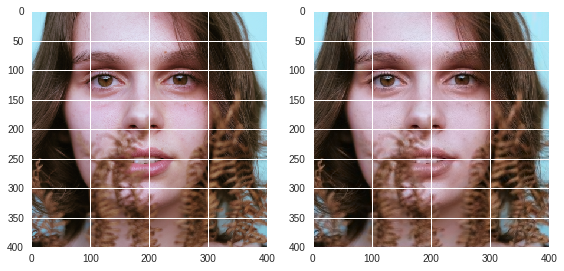

In [0]:
color_image_single("/content/gdrive/My Drive/Colab Notebooks/woman.jpg", model)

As expected, the model has predicted the colors almost perfectly. The lips are a little brownish, but if we give it more epochs or tune the learning rate a bit, the predicted image would be almost perfect.

Now let's see how the model does on another image of a face that it has never seen.

/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


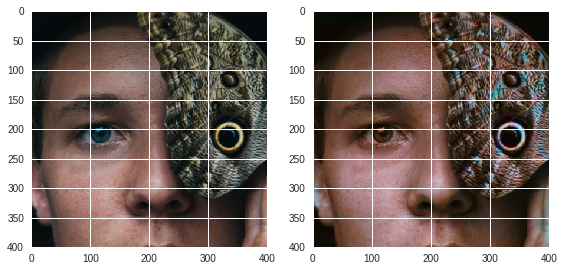

In [0]:
color_image_single("/content/gdrive/My Drive/Colab Notebooks/man.jpg", model)

Surprisingly the results are not as bad as expected. The reason for this is that the model has already seen a human face. If you look closely though, you would see that the colors used are the same colors as in the picture the model trained on, for example the eyes in the original image are blue, while the prediced eye color is brown like in the picture the model trained on.

Let's give it another picture.

/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


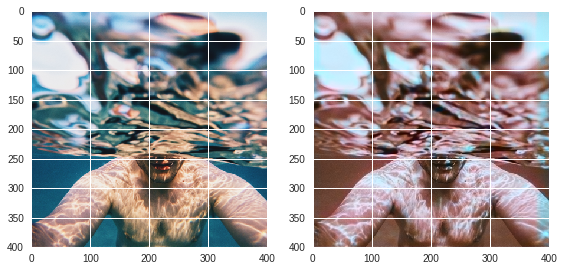

In [0]:
color_image_single("/content/gdrive/My Drive/Colab Notebooks/swim.jpg", model)

Here we see the model weakness in full power. It only uses brown and blue like in the picture it trained on. The image does not look anything like the original.

#### Model enhancements

Now that we have seen that our logic is working, let's enhance the model and train it on a bigger image dataset.

Interestingly enough, since this is a Fully Convolutional Network, it will probably be able to work with arbitrary image size. However this would mean passing images one by one during the training phase which would be really slow. To speed things up, I chose to fix the input image size to 256 x 256. Bigger images will make the traning slower and more memory intensive, while in smaller images we would not be able to really see the color fun. There are a number of ways to resize the image. I did not want to cause a distortion of the objects in the original image so I chose a more "radical" approach. I make the image square by cropping the sides of the bigger dimension. Then I resize the square image to a 256 x 256 size if the original image does not already have this size. The rest is copied from the original function.

In [0]:
def get_image(image_path):
    image = img_to_array(load_img(image_path), dtype = np.uint8)
    
    if image.shape[0] != 256 or image.shape[1] != 256:
        #crop image
        half_diff = round((image.shape[0] - image.shape[1]) / 2)
        if half_diff > 0:
            image = image[half_diff:image.shape[0] - half_diff, :, :]
        elif half_diff < 0:
            image = image[:, -half_diff:image.shape[1] + half_diff, :]
        
        image = resize(image, (256, 256))
    
    X = rgb2lab(image)[:,:,0] / 100.0
    X = X.reshape(256, 256, 1)
    
    Y = rgb2lab(image)[:,:,1:]
    Y[:,:,0] = (Y[:,:,0] + 86.185) / 184.439
    Y[:,:,1] = (Y[:,:,1] + 107.863) / 202.345

    return X, Y

In the coloring function I exchange the `tensorflow.keras.preprocessing.image.load_img` with `skimage.imread` so that we can use this function to give color to images from the WWW directly. Also the coloring function now can handle both RGB and Black and White images as an input (different parameter normalization is applied to the input due to the fact that RGB images have 3 dimensions while true Black and White images have only 2). 

In [0]:
# for single image or comparison with original
def color_image_single(image_url, model):
    image = imread(image_url)
    
    if len(image.shape) == 3:
        X = rgb2lab(image)[:,:,0] / 100.0
    elif len(image.shape) == 2:
        X = image / 255.0
    
    if X.shape[0] != 256 or X.shape[1] != 256:
        X = resize(X, (256, 256))
    
    X = X.reshape(1, 256, 256, 1)
    output = model.predict(X)
    output[0,:,:,0] = output[0,:,:,0] * 184.439 - 86.185
    output[0,:,:,1] = output[0,:,:,1] * 202.345 - 107.863
    
    # Output colorizations
    canvas = np.zeros((output.shape[1], output.shape[2], 3))
    canvas[:,:,0] = X[0][:,:,0] * 100.0
    canvas[:,:,1:] = output[0]

    imshow_collection((image, resize(lab2rgb(canvas), (image.shape[0], image.shape[1]))))

The next cell copies the whole Flicker 8k dataset from my Google Drive to the local drive of Google Colab VM, because reading images 1 by 1 from Google drive turned out to be extremely slow.

In [0]:
!cp "/content/gdrive/My Drive/Colab Notebooks/Flicker8k_Dataset.zip" .
!unzip Flicker8k_Dataset.zip

Define train, validation and test directories locally on Google Colab VM.

In [0]:
train_dir = "/content/Train/"
val_dir = "/content/Val/"
test_dir = "/content/Test/"

We use the same model structure with the same learning rate as before to see how it will perform with the whole Flicker 8k dataset which has 7691 images in the training dataset.

In [0]:
del model
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

In [0]:
opt = Adam(lr = 0.001)

model.compile(optimizer = opt, loss='mse')

Load the first 32 images from the validation directory, transorm them and use them as validation set later in the training process. 32 may be very few pictures, but it is enough to get a basic idea of how our model performs, wheter it exhibits high bias or high variance.

In [6]:
X_val = []
Y_val = []
counter = 0

for filename in sorted(os.listdir(val_dir)):
    X_curr, Y_curr = get_image(os.path.join(val_dir, filename))
    X_val.append(X_curr)
    Y_val.append(Y_curr)
    
    counter = counter + 1
    if counter == 32:
        break
    
X_val = np.array(X_val, dtype=float)
Y_val = np.array(Y_val, dtype=float)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "


#### Loading images in batches "trick"

The next cell is a little "trick" that I used during training of my models. I could not load the whole image dataset into memory due to Google Colab limitations of GPU memory. I decided to load them in batches of 256 images and train the model in mini-batches of 32. However when I have to do 20, 30, 40 or 50 epochs, re-reading all the images and transforming them each epoch made my models train really slow. So I decided to do the following:

1. Read the whole image dataset in batches of 256.
2. After the batch is transformed, normalized, etc, we get 2 resulting matrices - one for the input and one for the expected output.
3. Dump those NumPY matrices to disk as matrices, not as images.
4. Later on when we train the model, we just load the dump files of each batch one by one, without having to read and transform images over and over.

In [0]:
counter = 0
batch = 0

X = []
Y = []

for filename in os.listdir(train_dir):
    
    X_curr, Y_curr = get_image(os.path.join(train_dir, filename))
    X.append(X_curr)
    Y.append(Y_curr)
    
    counter = counter + 1
    
    if counter % 256 == 0:
        batch = batch + 1
        
        X = np.array(X, dtype=float)
        Y = np.array(Y, dtype=float)
        
        print ("Dumping batch " + str(batch))
        X.dump(str("X_" + str(batch) + ".dmp"))
        Y.dump(str("Y_" + str(batch) + ".dmp"))

        X = []
        Y = []

batch = batch + 1

X = np.array(X, dtype=float)
Y = np.array(Y, dtype=float)

print ("Dumping batch " + str(batch))
X.dump(str("X_" + str(batch) + ".dmp"))
Y.dump(str("Y_" + str(batch) + ".dmp"))

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "


Dumping batch 1
Dumping batch 2
Dumping batch 3
Dumping batch 4
Dumping batch 5
Dumping batch 6
Dumping batch 7
Dumping batch 8
Dumping batch 9
Dumping batch 10
Dumping batch 11
Dumping batch 12
Dumping batch 13
Dumping batch 14
Dumping batch 15
Dumping batch 16
Dumping batch 17
Dumping batch 18
Dumping batch 19
Dumping batch 20
Dumping batch 21
Dumping batch 22
Dumping batch 23
Dumping batch 24
Dumping batch 25
Dumping batch 26
Dumping batch 27
Dumping batch 28
Dumping batch 29
Dumping batch 30
Dumping batch 31


#### Train the same simple model on a bigger dataset

Train the model by reading each batch from disk as a NumPY matrix and then using 32 batch size during training. Do this for 20 epochs. After each batch, record the average model loss and validation loss values. Those will
be displayed after training is complete.

In [0]:
batch_iterator = 0
batch_counter = 0
total_batches = 31

loss = []
val_loss = []
iteration = []

for i in range(20):

    while batch_counter < total_batches:
        
        batch_counter = batch_counter + 1
        batch_iterator = batch_iterator + 1
        
        X = np.load(str("X_" + str(batch_counter) + ".dmp"))
        Y = np.load(str("Y_" + str(batch_counter) + ".dmp"))
 
        model_log = model.fit(x = X, y = Y, validation_data=(X_val, Y_val), batch_size=32, epochs=1)
            
        loss.append(np.mean(model_log.history['loss']))
        val_loss.append(np.mean(model_log.history['val_loss']))
        iteration.append(batch_iterator)
        
    batch_counter = 0

Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 6s 23ms/step - loss: 0.2738 - val_loss: 0.1853
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.1975 - val_loss: 0.1791
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.1905 - val_loss: 0.1705
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.1771 - val_loss: 0.1700
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.2093 - val_loss: 0.1699
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.1908 - val_loss: 0.1692
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.1936 - val_loss

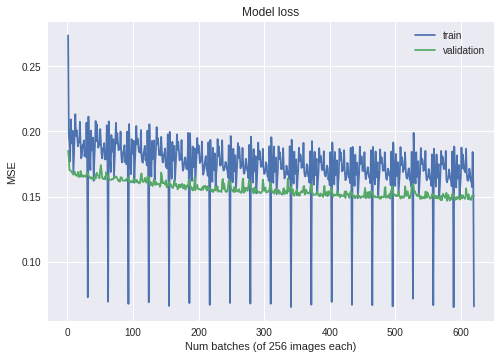

In [0]:
# plotting the metrics

plt.plot(iteration, loss)
plt.plot(iteration, val_loss)
plt.title('Model loss')
plt.ylabel('MSE')
plt.xlabel('Num batches (of 256 images each)')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

#### First run observations

After the first run of our most simple model, we observe the following:

1. The validation loss is smaller than the training loss. This was what first struck me as unusual. However, this turned out to be normal. We only validate on 32 images. If those images happen to be more easiliy recognizable for our model, the loss could be smaller than the training loss. For example if those images contain, grass, blue skies, etc, then the MSE would be smaller on them as compared to images that contain brightly colored carnival dresses for example. I have tried with different set of validation images and some of them produce lower loss than the current training set, some produce higher.
2. The model does not seem to learn much after the first 10-15 epochs. I have made attempts to train it for longer, it just lingers around the same values.
3. There is no sign of overfitting, maybe we have a high bias, but we need more observations to figure this out, we don't know what is the achievable loss value.

Let's evaluate the model on 32 images from the testing set.

In [0]:
X_test = []
Y_test = []
counter = 0

for filename in sorted(os.listdir(test_dir)):
    X_curr, Y_curr = get_image(os.path.join(test_dir, filename))
    X_test.append(X_curr)
    Y_test.append(Y_curr)
    
    counter = counter + 1
    if counter == 32:
        break
    
X_test = np.array(X_val, dtype=float)
Y_test = np.array(Y_val, dtype=float)

print(model.evaluate(X_test, Y_test, batch_size=32))

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "


32/32 [==============================] - 0s 3ms/step
0.15056553483009338


The loss is roughly the same as the validation loss. But I have no idea what loss value is normal, what is the loss we want to achieve (apparently lower is better, but how much is good enough). To get an idea of how our model performs, let's predict the colors of several pictures (3 from the testing set and 2 from the Web) with our model.

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


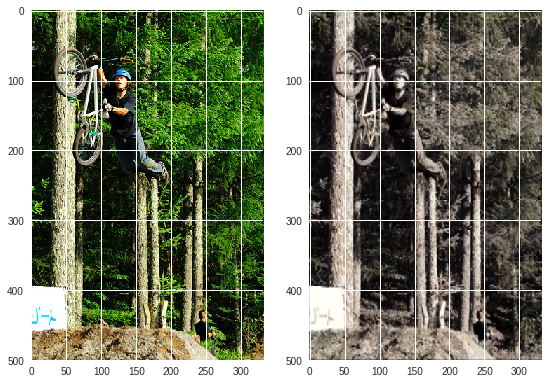

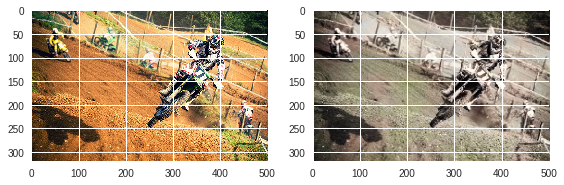

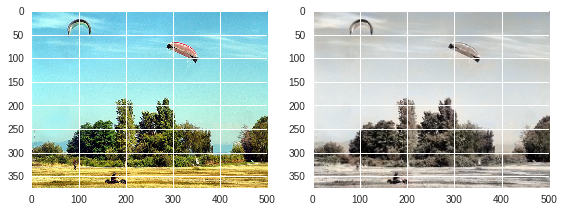

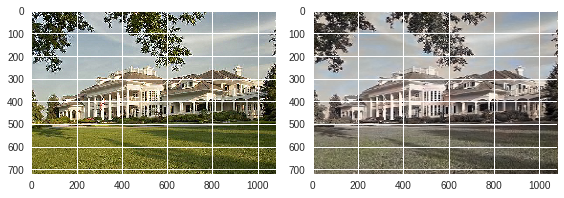

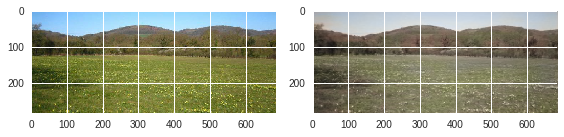

In [0]:
color_image_single(os.path.join(test_dir, "3690348036_a01f243fb0.jpg"), model)
color_image_single(os.path.join(test_dir, "3697675767_97796334e4.jpg"), model)
color_image_single(os.path.join(test_dir, "3726019124_f302b3d48a.jpg"), model)
color_image_single("http://townsquare.media/site/204/files/2018/02/alan-jackson-house-front.jpg", model)
color_image_single("http://data.wildlifetrusts.org/sites/default/files/imagecache/reserve_web_large/sites/default/files/Duke-of-York-Meadow-CREDIT-Helen-Woodman.jpg", model)

The pictures do not look very good. Apparently the model has done some training. It recognizes simple elements like grass, trees, skies, roofs, but the colors are very poor and very pale. We definitely have high bias. To check that we do not have high variance (of which we are almost certain), let's predict the color of 2 pictures from the training set as well.

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


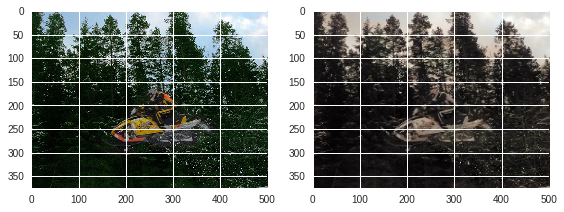

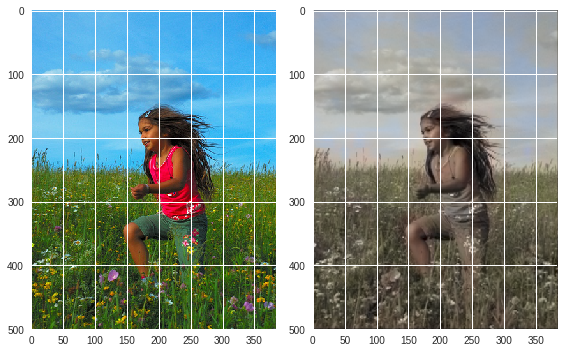

In [0]:
color_image_single(os.path.join(train_dir, "109738763_90541ef30d.jpg"), model)
color_image_single(os.path.join(train_dir, "174466741_329a52b2fe.jpg"), model)

The colors are not great either, they look as pale as those from the testing set. So no high variance, only high bias.

#### Modifying the learning rate

So our model does not train well, cannot learn a lot from the images. One possible reason for this might be the learning rate. If it is too high, we may "linger" around the minimum, but cannot approach it. To check this, let's train our model with one magnitude lower learning rate to see how it performs.

In [0]:
del model
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

opt = Adam(lr = 0.0001)

model.compile(optimizer = opt, loss='mse')

In [0]:
batch_iterator = 0
batch_counter = 0
total_batches = 31

loss = []
val_loss = []
iteration = []

for i in range(20):

    while batch_counter < total_batches:
        
        batch_counter = batch_counter + 1
        batch_iterator = batch_iterator + 1
        
        X = np.load(str("X_" + str(batch_counter) + ".dmp"))
        Y = np.load(str("Y_" + str(batch_counter) + ".dmp"))
 
        model_log = model.fit(x = X, y = Y, validation_data=(X_val, Y_val), batch_size=32, epochs=1)
            
        loss.append(np.mean(model_log.history['loss']))
        val_loss.append(np.mean(model_log.history['val_loss']))
        iteration.append(batch_iterator)
        
    batch_counter = 0

Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 6s 23ms/step - loss: 0.3013 - val_loss: 0.2534
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 6ms/step - loss: 0.2645 - val_loss: 0.2490
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 6ms/step - loss: 0.2556 - val_loss: 0.2420
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.2308 - val_loss: 0.2293
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 6ms/step - loss: 0.2593 - val_loss: 0.2078
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 5ms/step - loss: 0.2146 - val_loss: 0.1839
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 1s 6ms/step - loss: 0.2033 - val_loss

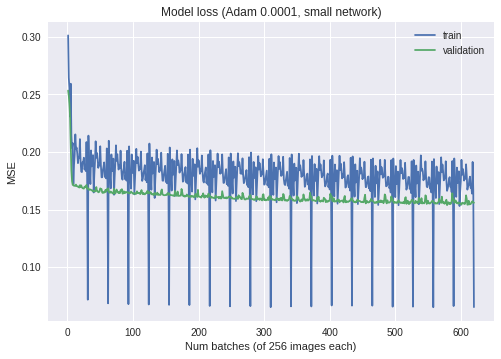

In [0]:
# plotting the metrics

plt.plot(iteration, loss)
plt.plot(iteration, val_loss)
plt.title('Model loss (Adam 0.0001, small network)')
plt.ylabel('MSE')
plt.xlabel('Num batches (of 256 images each)')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

We have roughly the same graph, nothing has changed significantly, so the learning rate is not the problem.

To tell you a little secret, I played a lot more with the learning rate to see what happens when you modify it. If I increase it more, the model cannot learn anything from the images, the loss value is even higher. If I decrease it, nothing interesting happens, it learns a little slowlier, but after a few epochs all models with different learning rates start to look the same (if the learning rate is small enough). I could not find any benefit from even smaller learning rate like 0.00001.

#### First model conclusions and fast forward to a bigger model

I reached the conclusion that our first model is very small to be able to describe the whole image set well. Modifying the learning rate does not help.

I tried a bigger model with ~2 million trainable parameters. The results were better, but still not good enough.

So after a few tests, I ended with the following model having roughly ~8.5 million trainable parameters:

In [0]:
del model
model = Sequential()
model.add(InputLayer(input_shape=(256, 256, 1)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

In [4]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      640       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 128)     73856     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 256)       295168    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 256)       590080    
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 32, 32, 512)       1180160   
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 16, 16, 512)       2359808   
__________

I have done some more tests to determine the correct learning rate and a learning rate of 0.0001 seems optimal so I will use it when compiling my model without a more detailed explanation of the tests that I have done to determine it.

In [0]:
opt = Adam(lr = 0.0001)

model.compile(optimizer = opt, loss='mse')

Let's train this model for 30 epochs to give it time to converge.

In [0]:
batch_iterator = 0
batch_counter = 0
total_batches = 31

loss = []
val_loss = []
iteration = []

for i in range(30):

    while batch_counter < total_batches:
        
        batch_counter = batch_counter + 1
        batch_iterator = batch_iterator + 1
        
        X = np.load(str("X_" + str(batch_counter) + ".dmp"))
        Y = np.load(str("Y_" + str(batch_counter) + ".dmp"))
 
        model_log = model.fit(x = X, y = Y, validation_data=(X_val, Y_val), batch_size=32, epochs=1)
            
        loss.append(np.mean(model_log.history['loss']))
        val_loss.append(np.mean(model_log.history['val_loss']))
        iteration.append(batch_iterator)
        
    batch_counter = 0
    
model.save("/content/gdrive/My Drive/Colab Notebooks/saved_models/color_big_nn_adam0001.h5")

Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 17s 66ms/step - loss: 0.2782 - val_loss: 0.1885
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 8s 33ms/step - loss: 0.2054 - val_loss: 0.1759
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 8s 33ms/step - loss: 0.1950 - val_loss: 0.1737
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 8s 32ms/step - loss: 0.1841 - val_loss: 0.1732
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 9s 33ms/step - loss: 0.2150 - val_loss: 0.1795
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 8s 32ms/step - loss: 0.1987 - val_loss: 0.1783
Train on 256 samples, validate on 32 samples
Epoch 1/1
256/256 [==============================] - 8s 33ms/step - loss: 0.2012 - v

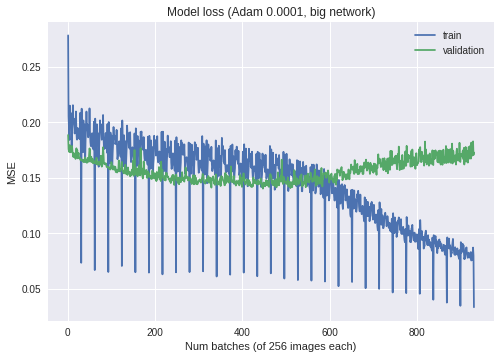

In [0]:
# plotting the metrics

plt.plot(iteration, loss)
plt.plot(iteration, val_loss)
plt.title('Model loss (Adam 0.0001, big network)')
plt.ylabel('MSE')
plt.xlabel('Num batches (of 256 images each)')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

Wow now that's a definite sign of overfitting. The validation loss drops for the first 20 epochs and then starts to rise again. The training loss drops for the first 20 epochs and then drops more steeply.

To see what is going on, let's predict the color for a couple of pictures from the Testing dataset and from the Web.

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


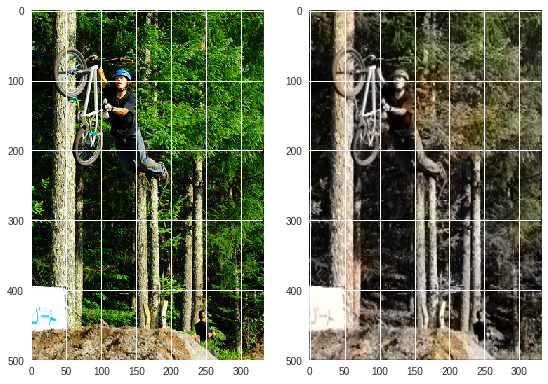

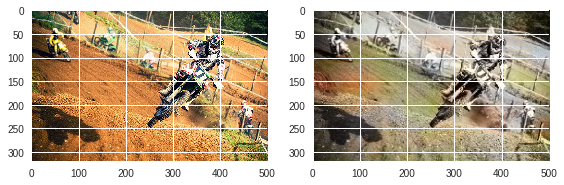

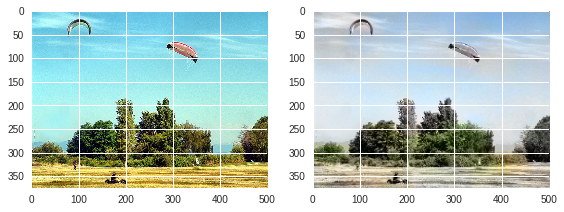

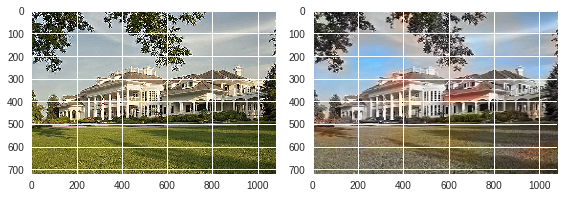

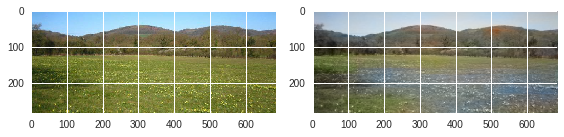

In [0]:
color_image_single(os.path.join(test_dir, "3690348036_a01f243fb0.jpg"), model)
color_image_single(os.path.join(test_dir, "3697675767_97796334e4.jpg"), model)
color_image_single(os.path.join(test_dir, "3726019124_f302b3d48a.jpg"), model)
color_image_single("http://townsquare.media/site/204/files/2018/02/alan-jackson-house-front.jpg", model)
color_image_single("http://data.wildlifetrusts.org/sites/default/files/imagecache/reserve_web_large/sites/default/files/Duke-of-York-Meadow-CREDIT-Helen-Woodman.jpg", model)

There is a definite difference from the colors of the first simple model. The colors here are more vivid, much closer to the original. However they all look wrong. I can see grey patches in the middle of a green grass field, some of the roofs are far too red and all of the pictures have colorful blobs in them that do not look right.

Now let's predict the color of some pictures from the training set:

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


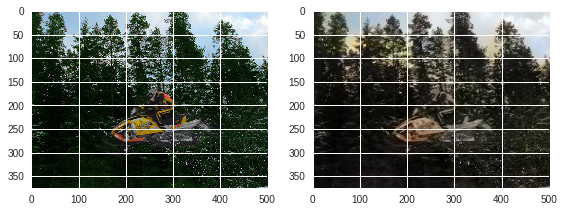

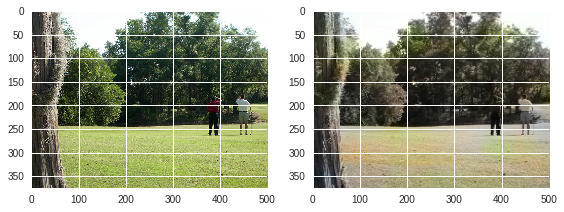

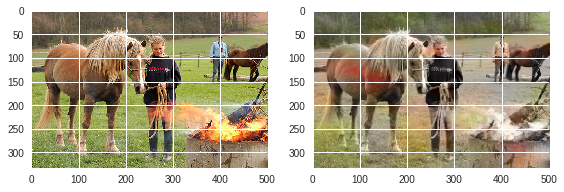

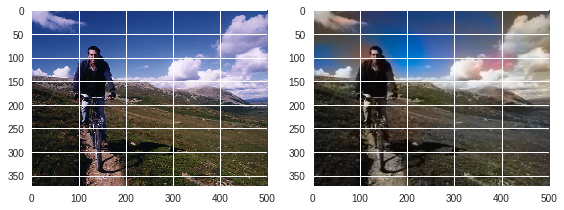

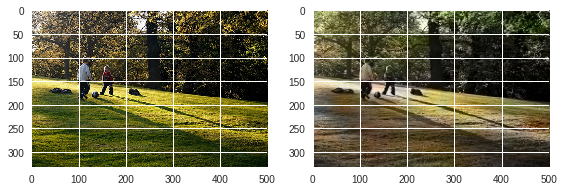

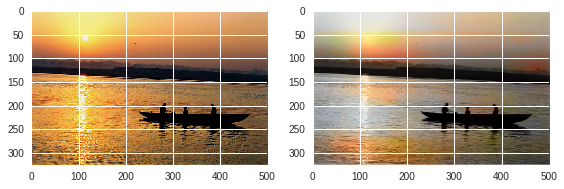

In [0]:
color_image_single(os.path.join(train_dir, "109738763_90541ef30d.jpg"), model)
color_image_single(os.path.join(train_dir, "127488876_f2d2a89588.jpg"), model)
color_image_single(os.path.join(train_dir, "10815824_2997e03d76.jpg"), model)
color_image_single(os.path.join(train_dir, "95728660_d47de66544.jpg"), model)
color_image_single(os.path.join(train_dir, "197504190_fd1fc3d4b7.jpg"), model)
color_image_single(os.path.join(train_dir, "223299137_b0e81ac145.jpg"), model)

Strangely enough those are not perfect as well. The colors look better than those of the testing set, but I can still see colorful blobs here and there. Have in mind that we do not expect the model to produce an image just like the original one. We want it to be able to make a "believable" coloration of a black and white picture. For example the fire in the third picture is colored like a smoke and I am able to accept that, because it can be interpreted as smoke. But the red blobs in the grass field are not OK.

#### Bigger model first run conclusions

It is obvious that the bigger model is better at describing different images than the smaller model. The colors are more vivid, it can distinguish between daylight sky and sunset. The problem however is that it overfits relatively quickly only after 20 epochs. After 30 epochs I still had high bias combined with an increasing high variance. I believe that if allowed to train further, this model can really reduce the bias, but the variance will be tremendous. The reason behind this is that the image set is not big enough for the model to be able to generalize well. If we want good colors, we need a big model, but the big model is "hungry" for data. Without more data, it "memorizes" what it has been given and fails to generalize.

#### Data generation for the bigger model

There are 2 approaches to the "not enough data" problem:

1. Find more data (obviously).
2. Use an image generator. An image generator takes the images from the small dataset and starts to randomly modify some of them: rotating, flipping, squeezing, streching, etc. Due to the random factor of which images are chosen by the generator and how they are processed, the model has a much harder time to overfit. An image generator basically provides an endless stream of images similar to the original, but not exactly the same.

I have tried both approaches, but I will describe in detail only the second one. The first one was a very long and painful effort due to a ton of limitations of Google Colab and I cannot possibly describe it in detail. I will just provide the results I achieved at the end.

Let's start by recreating our model to reset the weights. I don't have enough memory to keep a copy of the previous model so I am overwriting it instead.

In [0]:
del model
model = Sequential()
model.add(InputLayer(input_shape=(256, 256, 1)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

In [0]:
opt = Adam(lr = 0.0001)

model.compile(optimizer = opt, loss='mse')

We define an Image Generator instance allowing it to flip images horizontally, rotate them up to 20 degrees, zoom in on them and shear them.

In [0]:
datagen = ImageDataGenerator(
                shear_range=0.2,
                zoom_range=0.2,
                rotation_range=20,
                horizontal_flip=True)

Using the defined Image Data Generator, we train our model once again, this time for 45 epochs to give it time to learn and to see if it overfits.

In [0]:
batch_iterator = 0
batch_counter = 0
total_batches = 31

loss = []
val_loss = []
iteration = []

for i in range(30):

    while batch_counter < total_batches:
        
        batch_counter = batch_counter + 1
        batch_iterator = batch_iterator + 1
        
        X = np.load(str("X_" + str(batch_counter) + ".dmp"))
        Y = np.load(str("Y_" + str(batch_counter) + ".dmp"))
 
        model_log = model.fit_generator(datagen.flow(x = X, y = Y, batch_size = 32), validation_data=(X_val, Y_val), steps_per_epoch=8, epochs=1)
            
        loss.append(np.mean(model_log.history['loss']))
        val_loss.append(np.mean(model_log.history['val_loss']))
        iteration.append(batch_iterator)
        
    batch_counter = 0
    
model.save("/content/gdrive/My Drive/Colab Notebooks/saved_models/color_big_nn_datagen.h5")

In [0]:
# plotting the metrics

plt.plot(iteration, loss)
plt.plot(iteration, val_loss)
plt.title('model loss')
plt.ylabel('mse')
plt.xlabel('256 batch iteration')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

<img src="big_model_datagen_loss.png" align="left"/>

The graph looks better now. No overfitting. But the error rate is higher than what we had during the previous training attempt, which tells me that probably we did not do very well. Let's predict the color of some pictures again.


/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


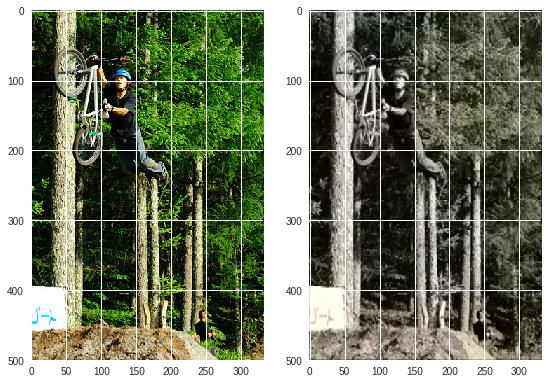

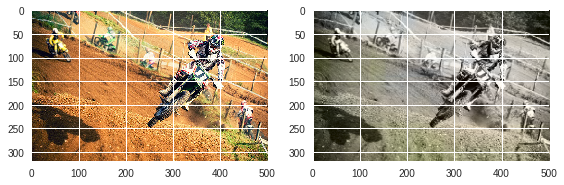

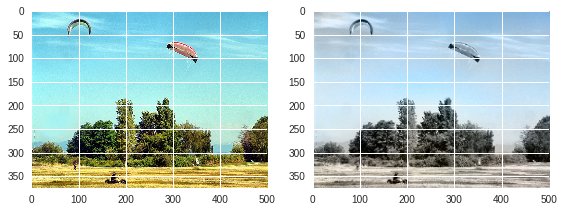

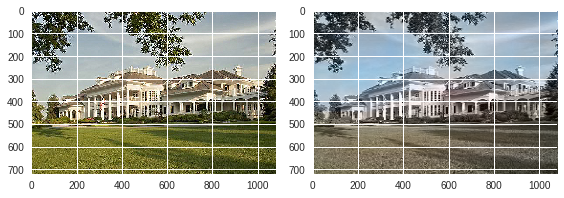

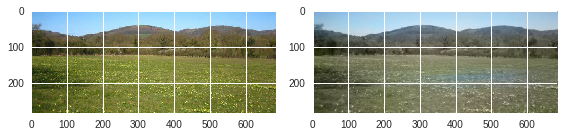

In [17]:
color_image_single(os.path.join(test_dir, "3690348036_a01f243fb0.jpg"), model)
color_image_single(os.path.join(test_dir, "3697675767_97796334e4.jpg"), model)
color_image_single(os.path.join(test_dir, "3726019124_f302b3d48a.jpg"), model)
color_image_single("http://townsquare.media/site/204/files/2018/02/alan-jackson-house-front.jpg", model)
color_image_single("http://data.wildlifetrusts.org/sites/default/files/imagecache/reserve_web_large/sites/default/files/Duke-of-York-Meadow-CREDIT-Helen-Woodman.jpg", model)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


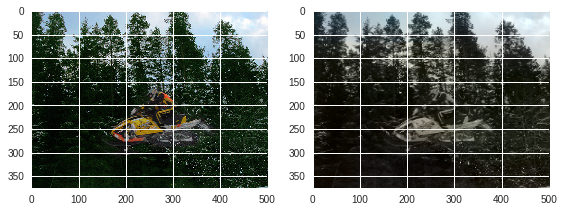

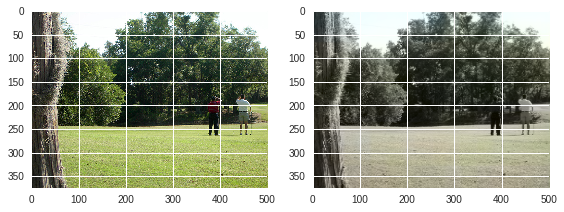

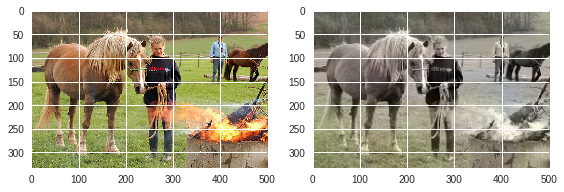

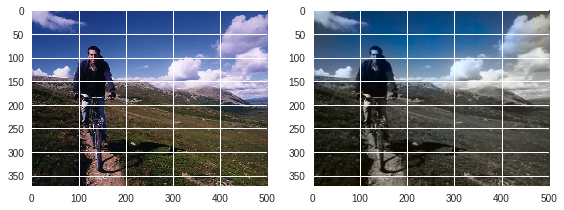

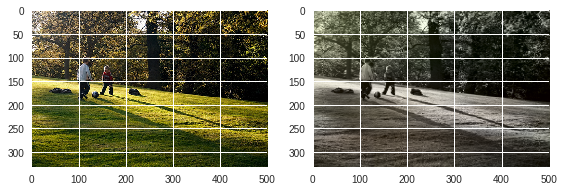

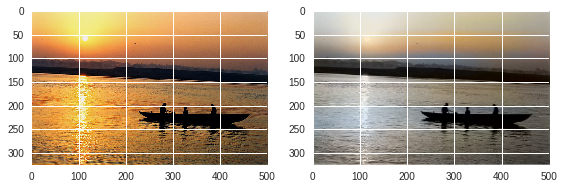

In [18]:
color_image_single(os.path.join(train_dir, "109738763_90541ef30d.jpg"), model)
color_image_single(os.path.join(train_dir, "127488876_f2d2a89588.jpg"), model)
color_image_single(os.path.join(train_dir, "10815824_2997e03d76.jpg"), model)
color_image_single(os.path.join(train_dir, "95728660_d47de66544.jpg"), model)
color_image_single(os.path.join(train_dir, "197504190_fd1fc3d4b7.jpg"), model)
color_image_single(os.path.join(train_dir, "223299137_b0e81ac145.jpg"), model)

Both training and test pictures do not look very good. The whole model has a tendency to overshoot the blue range and as a result the colors are not that vivid. 

#### Bigger model using data generation conclusions

So the results from the bigger model using data generation are not as good as I expected. In theory everything was supposed to work well, but in practice it is not. Indeed there is no more overfitting, but the bias is really high. It looks even worse than the model that overfit. I believe that by providing the model with an endless stream of pictures of the same kind, it cannot learn to generalize well enough. It cannot overfit, because we always change the exact picture, but the general colors stay the same so the model starts to have a tendency to the most used color in those original ~7600 pictures, which in our case apparently is blue. Data generation is a good approach for image classification or if used in a very specific class of images. For example if we want to train a model to paint skies, Data generation might help. But in this case we have very few and very diverse pictures and Data generation made things even worse for us by making our model believe that everything in the world is blueish :)

#### Bigger model on a bigger image dataset

For our final attempt, I tried to train the exact same model on a bigger image dataset. This was a very slow and very hard process mostly because of the limitations of Google Colab. I created a lot of helper functions, trained in parts, saved hundreds of temporary models to restart from a checkpoint when my kernel gets killed, etc. I will not go into detail of what exactly I did. The important part is that I traned the same model on a 100 000 images for several epochs. 

The images are taken from the "testing" split of Places dataset which could be found here:

[Places dataset](http://places2.csail.mit.edu/download.html)

I took the Small images (256 x 256) so that I don't have to resize them.

Here are 2 graphs showing the loss function that I saved during the training:

<img src="big_model_big_dataset_loss1.png"/>
<img src="big_model_big_dataset_loss2.png"/>

The loss slowly decreases so I am guessing the model can benefit from 10-20 epochs of training, which I could not achieve.

Here are some pictures predicted with this model:

In [0]:
del model
model = Sequential()
model.add(InputLayer(input_shape=(256, 256, 1)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(2, (3, 3), activation='sigmoid', padding='same'))

In [0]:
model.load_weights("/content/gdrive/My Drive/Colab Notebooks/saved_models/color_places_best_so_far.h5")

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


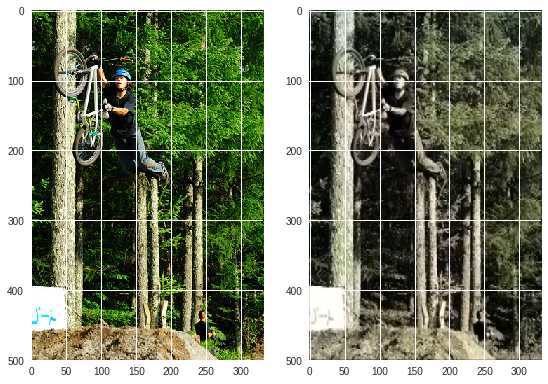

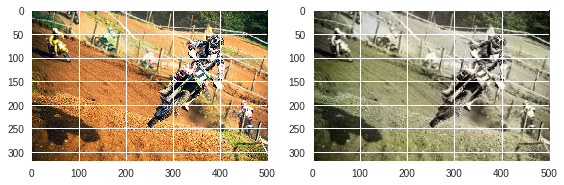

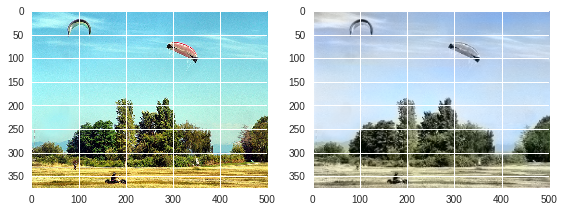

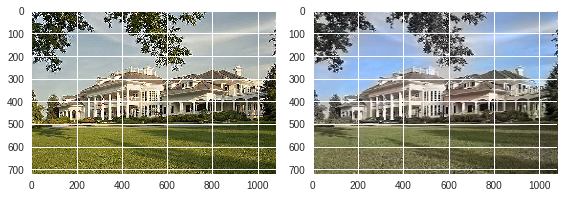

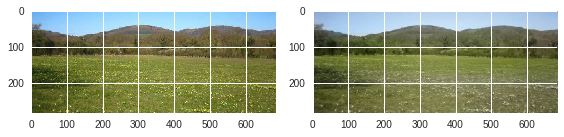

In [21]:
color_image_single(os.path.join(test_dir, "3690348036_a01f243fb0.jpg"), model)
color_image_single(os.path.join(test_dir, "3697675767_97796334e4.jpg"), model)
color_image_single(os.path.join(test_dir, "3726019124_f302b3d48a.jpg"), model)
color_image_single("http://townsquare.media/site/204/files/2018/02/alan-jackson-house-front.jpg", model)
color_image_single("http://data.wildlifetrusts.org/sites/default/files/imagecache/reserve_web_large/sites/default/files/Duke-of-York-Meadow-CREDIT-Helen-Woodman.jpg", model)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


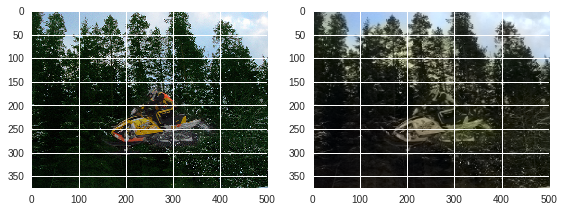

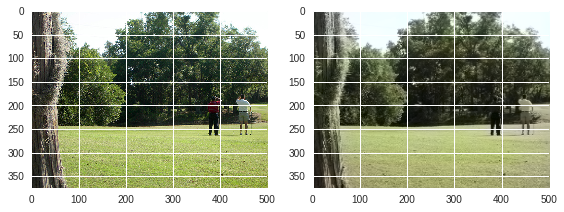

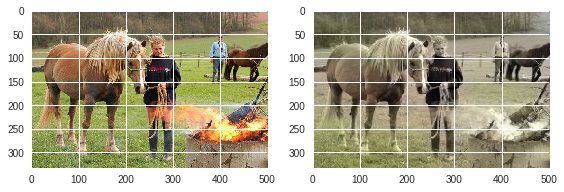

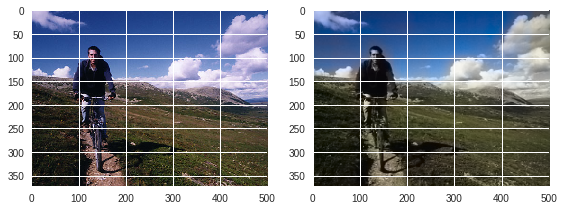

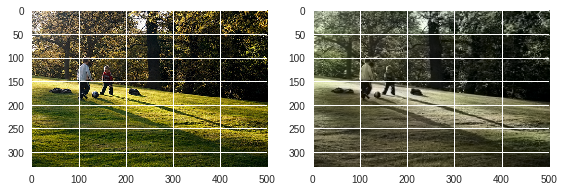

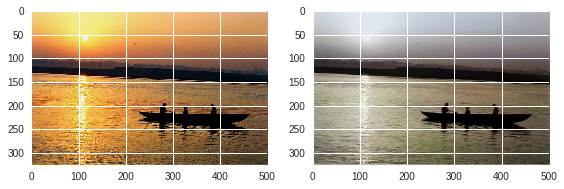

In [22]:
color_image_single(os.path.join(train_dir, "109738763_90541ef30d.jpg"), model)
color_image_single(os.path.join(train_dir, "127488876_f2d2a89588.jpg"), model)
color_image_single(os.path.join(train_dir, "10815824_2997e03d76.jpg"), model)
color_image_single(os.path.join(train_dir, "95728660_d47de66544.jpg"), model)
color_image_single(os.path.join(train_dir, "197504190_fd1fc3d4b7.jpg"), model)
color_image_single(os.path.join(train_dir, "223299137_b0e81ac145.jpg"), model)

All the pictures are much better looking than what we had so far. Of course not all of them are good. For example the sunset is not great. But the difference from the previously trained models is obvious. So apparently having a lot of pictures to train on is invaluable.

### Final conclusion

The task to train a neural network model to bring color into images is daunting. It is not easy to train a good model that can color just about any image. If the model is small, it cannot learn well, if it is big, it needs a looooot of data to be able to learn well without overfitting. Data generation does not help much in this specific task. The best results that I managed to achieve was with a medium sized fully convolutional model, training on 100 000 pictures for several epochs. Traning such a network is slow. If one wants to achieve good looking results, a lot of processing power and time would be needed.

### What I tried, but did not work

1. Using Leaky ReLU for activation function in the layers
<br> &nbsp; &nbsp; => Got the same convergence speed and performance as the simple ReLU
2. Batch normalization after each convolution layer
<br> &nbsp; &nbsp; => No difference in the convergence rate or loss function compared to no normalization between layers
3. Using Hyperbolic Tangent instead of Sigmoid for the final layer. I had to rescale the output values to fall within (-1, 1) range. Some papers say that it is better than Sigmoid due to the steeper gradients near 0.
<br> &nbsp; &nbsp; => Got a more erratic behavior than Sigmoid. One possible explanation is that I may have been "jumping over" the minimum due to the steeper gradient. I did not investigate further.
4. Transfer learning.
<br> &nbsp; &nbsp; => I made a poor attempt at this and failed. I tried to used the convolution layers of Inception v3 to pass the encoded information to the decoder part of my network. The results were very bad. There were almost no true colors predicted. Maybe I did something wrong. More time needs to be spent here.

### Future work

This is a huge topic. There are so many things that I would have tried and would like to try in the future to name a few:

1. Training a bigger model on millions of images. This should be able to predict even more vivid colors.
2. Train on a specific class of images. For example only train on landscapes with meadows, trees and skies. Since the choice is limited, the network should be able to predict this type of image better.
3. Try a different model architecture. Possibly using 2 models in a Generative Adversarial Network (GAN). This paper [6] claims that some very nice results were achieved this way.
4. Try the so called "fusion" technique. It is described in [1]. It is a fusion between a well-trained image classification network (like VGG-19 or Inception v3) and our own network. Pass the image through our "encoder" and at the same time pass it through the well-trained network. "Fuse" the resulting vectors together and pass them on to the "decoder" part of our network.
5. Try some custom kind of Residual Network where the information from a layer in the encoder is passed directly onto the corresponding layer of the same size in the decoder.
6. Buy a bigger and more powerful computer :)


#### In the end

Some true black and white photos

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
    warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
    out_of_range_float = (np.issubdtype(image.dtype, np.float) and


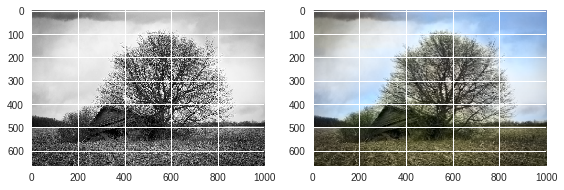

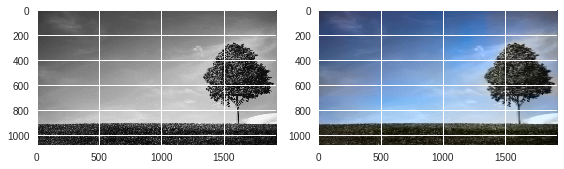

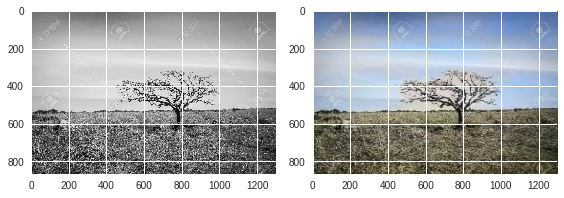

In [27]:
color_image_single("https://static1.squarespace.com/static/54d7cf49e4b05cca76773e91/56e9e517f699bb6cbeabcee2/574dde50b09f95ab5f3e747a/1524078316497/20130402-20130402-IMG_3366-Edit.jpg", model)
color_image_single("/content/gdrive/My Drive/Colab Notebooks/Test/Black-And-White-Tree-Wallpaper-HD.jpg", model)
color_image_single("https://previews.123rf.com/images/cloudmineamsterdam/cloudmineamsterdam1701/cloudmineamsterdam170103160/70641412-black-and-white-small-dead-tree-on-a-dry-yellow-grass-hill-with-a-clear-sky-background.jpg", model)

 ### Resources:
 
1. [Atoshi Iizuka, Edgar Simo-Serra, and Hiroshi Ishikawa.
"Let there be Color!: Joint End-to-end Learning of Global and Local Image Priors for Automatic Image Colorization with Simultaneous Classification".
ACM Transaction on Graphics (Proc. of SIGGRAPH), 35(4):110, 2016.](http://hi.cs.waseda.ac.jp/~iizuka/projects/colorization/data/colorization_sig2016.pdf)
2. [Richard Zhang, Phillip Isola, Alexei A. Efros, 2016, Colorful Image Colorization](https://arxiv.org/abs/1603.08511)
3. [Wikipedia: CIELAB color space](https://en.wikipedia.org/wiki/CIELAB_color_space)
4. [What are the ranges of coordinates in the CIELAB color space?](https://stackoverflow.com/questions/19099063/what-are-the-ranges-of-coordinates-in-the-cielab-color-space)
5. [How to colorize black & white photos with just 100 lines of neural network code](https://medium.freecodecamp.org/colorize-b-w-photos-with-a-100-line-neural-network-53d9b4449f8d)
6. [Image Colorization with Generative Adversarial Networks](https://arxiv.org/abs/1803.05400)
7. [Deconvolution and Checkerboard Artifacts](https://distill.pub/2016/deconv-checkerboard/)